In [25]:
import tensorflow as tf 
import numpy as np 
from tensorflow import keras 
import os 
import math 
import random 
import pickle 
import glob
import matplotlib.pyplot as plt 
from collections import deque 
from tensorflow.keras import layers
import time 
import scipy.io as sio
import matplotlib as mpl 

from vehicle_model_variant import Environment_DDPG 
# from vehicle_model_ECMS import Environment_ECMS  
from cell_model import CellModel 
from driver_MDP import Driver_MDP 

os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

In [2]:
battery_path = "../../OC_SIM_DB/OC_SIM_DB_Bat/OC_SIM_DB_Bat_nimh_6_240_panasonic_MY01_Prius.mat"
motor_path = "../../OC_SIM_DB/OC_SIM_DB_Mot/OC_SIM_DB_Mot_pm_95_145_X2.mat"
cell_model = CellModel()
driver = Driver_MDP(0.02) 

num_states = 4 

In [3]:
def get_actor(): 
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)
    
    inputs = layers.Input(shape=(num_states))
    inputs_batchnorm = layers.BatchNormalization()(inputs)
    
    out = layers.Dense(512, activation="relu")(inputs_batchnorm)
#     out = layers.BatchNormalization()(out)
    out = layers.Dense(512, activation="relu")(out)
#     out = layers.BatchNormalization()(out)
    outputs = layers.Dense(1, activation="sigmoid", 
                          kernel_initializer=last_init)(out)
    model = tf.keras.Model(inputs, outputs)
    return model

def get_critic(): 
    state_input = layers.Input(shape=(num_states))
    state_input_batchnorm = layers.BatchNormalization()(state_input)
    
    state_out = layers.Dense(16, activation="relu")(state_input_batchnorm)
#     state_out = layers.BatchNormalization()(state_out)
    state_out = layers.Dense(32, activation="relu")(state_out)
#     state_out = layers.BatchNormalization()(state_out)
    
    action_input = layers.Input(shape=(1))
    action_out = layers.Dense(32, activation="relu")(action_input)
#     action_out = layers.BatchNormalization()(action_out)
    
    concat = layers.Concatenate()([state_out, action_out]) 
    
    out = layers.Dense(512, activation="relu")(concat)
#     out = layers.BatchNormalization()(out)
    out = layers.Dense(512, activation="relu")(out)
#     out = layers.BatchNormalization()(out)
    outputs = layers.Dense(1)(out)
    
    model = tf.keras.Model([state_input, action_input], outputs)
    return model 
    
    
actor_model = get_actor() 

In [4]:
def policy_epsilon_greedy(state, eps): 
    j_min = state[0][-2].numpy()
    j_max = state[0][-1].numpy()

    if random.random() < eps: 
        a = random.randint(0, 9)
        return np.linspace(j_min, j_max, 10)[a]
    else: 
        sampled_action = tf.squeeze(actor_model(state)).numpy()  
        legal_action = sampled_action * j_max 
        legal_action = np.clip(legal_action, j_min, j_max)
        return legal_action

In [13]:
def test_model(cycle, model_path, fig_title): 
    env_DDPG = Environment_DDPG(cell_model, cycle, battery_path, motor_path, 10) 
    actor_model.load_weights(model_path)
    
    total_reward = 0 
    state = env_DDPG.reset() 
    while True: 
        tf_state = tf.expand_dims(tf.convert_to_tensor(state), 0)
        action = policy_epsilon_greedy(tf_state, -1)
        next_state, reward, done = env_DDPG.step(action)
        
        state = next_state 
        total_reward += reward 
        
        if done: 
            break 
        
#     SOC_deviation_history = np.sum(np.abs(np.array(env.history["SOC"]) - 0.6)) 
    history_DDPG = env_DDPG.history 
    print("******************* Test is start *****************")
    print("final SOC for DDPG: {:.4f}".format(history_DDPG["SOC"][-1]))
    print("FC for DDPG: {:.4f}".format(env_DDPG.fuel_consumption))
    print("******************* Test is done *****************")
    print("")
    
    plt.figure(figsize=(20, 6))
    
    plt.subplot(1, 3, 1)
    plt.plot(cycle * 3.6, linewidth=2, )
    plt.ylabel("Velocity[km/h]", fontsize=16)
    plt.xlabel("Time[s]", fontsize=16)
    plt.title(fig_title)
    plt.grid() 
    
    plt.subplot(1, 3, 2)
    plt.plot(history_DDPG["Action"], linewidth=2)
    plt.title("Actions of Agent", fontsize=16) 
    plt.xlabel("Time[s]", fontsize=16) 
    plt.ylabel("Current Density[A/$cm^2$]", fontsize=16)
    plt.grid() 
    
    plt.subplot(1, 3, 3)
    reference_line = np.zeros_like(history_DDPG["SOC"])
    reference_line[:] = 0.6 
    plt.plot(history_DDPG["SOC"], linewidth=2)
    plt.plot(reference_line, "r--")
    plt.title("SOC trajectory", fontsize=16)
    plt.xlabel("Time[s]", fontsize=16) 
    plt.ylabel("SOC", fontsize=16)
    plt.grid() 

    plt.savefig("{}.png".format(fig_title))
    return history_DDPG 

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5992
FC for DDPG: 22.0753
******************* Test is done *****************



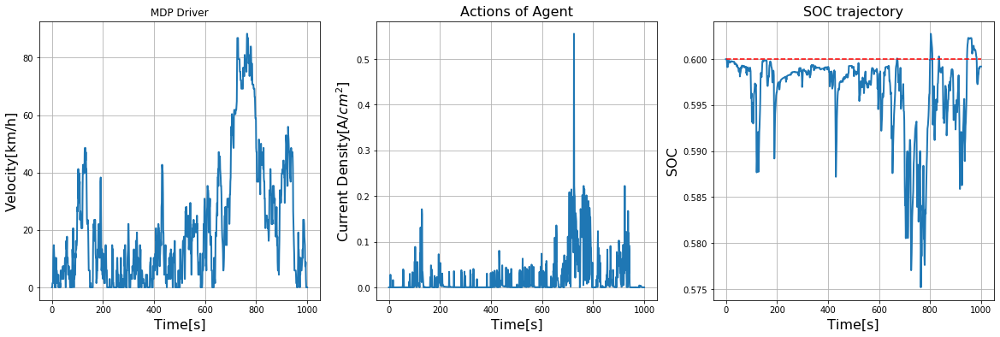

In [17]:
training_cycle = '../../OC_SIM_DB/OC_SIM_DB_Cycles/Highway/01_FTP72_fuds.mat'

test_cycles = [
    "../data/driving_cycles/all2/us06_hwy.mat", 
    "../data/driving_cycles/all/wvucity.mat",
] 
# driving_cycle = sio.loadmat(training_cycle)
# driving_cycle = sio.loadmat(test_cycles[1])
# driving_cycle = driving_cycle["sch_cycle"][:, 1]
driving_cycle = np.array(driver.get_cycle())  

# actor = "./DDPG_reference_trained_variant_all/actor_model.h5" 
actor = "./DDPG_MDP_trained/actor_model.h5" 
history = test_model(driving_cycle, actor, "MDP Driver")

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5996
FC for DDPG: 6.9711
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5995
FC for DDPG: 9.5489
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5991
FC for DDPG: 9.0491
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5991
FC for DDPG: 8.3570
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5997
FC for DDPG: 11.6118
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5984
FC for DDPG: 18.6923
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5999
FC for DDPG: 11.1322
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5914
FC for DDPG: 16.0222
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5983
FC for DDPG: 8.8915
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5983
FC for DDPG: 4.6437
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5996
FC for DDPG: 11.8585
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5959
FC for DDPG: 10.8578
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5985
FC for DDPG: 11.9670
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 11.5840
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5950
FC for DDPG: 53.0312
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 6.0311
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5857
FC for DDPG: 8.9513
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5998
FC for DDPG: 4.9333
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5971
FC for DDPG: 9.4040
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5950
FC for DDPG: 15.8937
******************* Test is done *****************



C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5989
FC for DDPG: 21.7302
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5919
FC for DDPG: 10.1380
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5984
FC for DDPG: 11.1464
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5982
FC for DDPG: 20.4646
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5985
FC for DDPG: 14.5304
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 7.4047
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 6.1770
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 10.3693
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5967
FC for DDPG: 8.9975
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5992
FC for DDPG: 9.1432
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5977
FC for DDPG: 13.7611
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5984
FC for DDPG: 7.5764
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.6019
FC for DDPG: 25.8383
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5971
FC for DDPG: 6.4605
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5990
FC for DDPG: 22.1450
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5991
FC for DDPG: 9.9617
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5983
FC for DDPG: 14.0206
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5992
FC for DDPG: 8.6884
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5994
FC for DDPG: 10.0035
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5992
FC for DDPG: 12.0556
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 7.7682
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5979
FC for DDPG: 19.5148
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5990
FC for DDPG: 7.5404
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5597
FC for DDPG: 66.5747
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5995
FC for DDPG: 9.9730
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5982
FC for DDPG: 7.9632
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5981
FC for DDPG: 19.4679
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5984
FC for DDPG: 12.2260
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5991
FC for DDPG: 11.5375
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5988
FC for DDPG: 12.2849
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5993
FC for DDPG: 13.1252
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 7.5369
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5991
FC for DDPG: 6.3704
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5989
FC for DDPG: 12.3120
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5933
FC for DDPG: 9.2649
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5961
FC for DDPG: 8.6905
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.6005
FC for DDPG: 21.9640
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5998
FC for DDPG: 26.5922
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5997
FC for DDPG: 6.3412
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5980
FC for DDPG: 27.9262
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5946
FC for DDPG: 8.4942
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5982
FC for DDPG: 15.3512
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5980
FC for DDPG: 10.6627
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5995
FC for DDPG: 18.4037
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5997
FC for DDPG: 10.3772
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5972
FC for DDPG: 23.9522
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5989
FC for DDPG: 8.7866
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 6.2886
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5984
FC for DDPG: 8.3820
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5988
FC for DDPG: 15.9074
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 13.4072
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5988
FC for DDPG: 7.8917
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5990
FC for DDPG: 11.4231
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5948
FC for DDPG: 11.5623
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5997
FC for DDPG: 20.3376
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5992
FC for DDPG: 21.2075
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5983
FC for DDPG: 13.8702
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5980
FC for DDPG: 12.4225
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5979
FC for DDPG: 11.4070
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5822
FC for DDPG: 9.1691
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5973
FC for DDPG: 10.9616
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5981
FC for DDPG: 12.4801
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5995
FC for DDPG: 18.3927
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5989
FC for DDPG: 11.9816
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5952
FC for DDPG: 6.6681
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5941
FC for DDPG: 12.3007
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5979
FC for DDPG: 13.8583
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 7.7266
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5988
FC for DDPG: 4.8235
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5988
FC for DDPG: 14.5272
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5965
FC for DDPG: 18.7011
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5979
FC for DDPG: 9.0737
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5985
FC for DDPG: 5.4088
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5994
FC for DDPG: 22.2172
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5937
FC for DDPG: 15.0443
******************* Test is done *****************

maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5975
FC for DDPG: 8.3077
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5980
FC for DDPG: 7.6323
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5986
FC for DDPG: 16.3312
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.6002
FC for DDPG: 8.2604
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:253: RuntimeWarning: invalid value encountered in double_scalars
  del_i = (1 / (2 * r_cha)) * (v_cha - (v_cha ** 2 - 4 * r_cha * p_bat) ** (0.5)) * (p_bat < 0) + (1 / (
C:\Users\ValueCreatorSong\Desktop\Academic\graduate_paper\degradation_model\experiment\model_validation\vehicle_model_variant.py:254: RuntimeWarning: invalid value encountered in double_scalars
  2 * r_dis)) * (v_dis - (v_dis ** 2 - 4 * r_dis * p_bat) ** (0.5)) * (p_bat >= 0)


maximum steps, simulation is done ... 
******************* Test is start *****************
final SOC for DDPG: 0.5993
FC for DDPG: 14.3097
******************* Test is done *****************



C:\Users\ValueCreatorSong\Anaconda3\envs\tf2.1_gpu\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


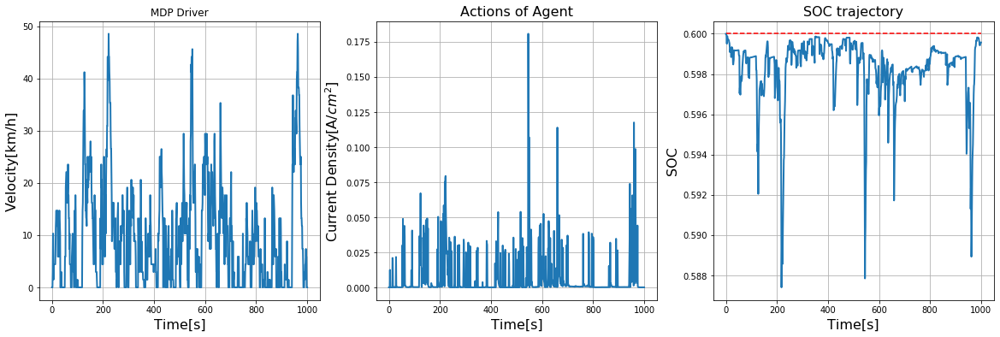

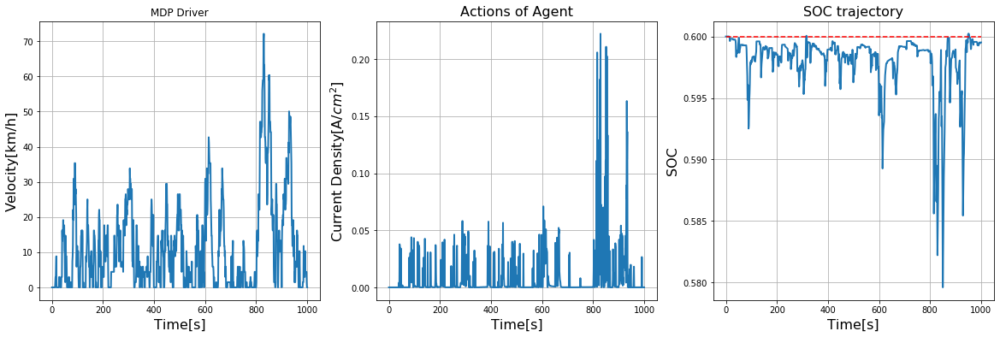

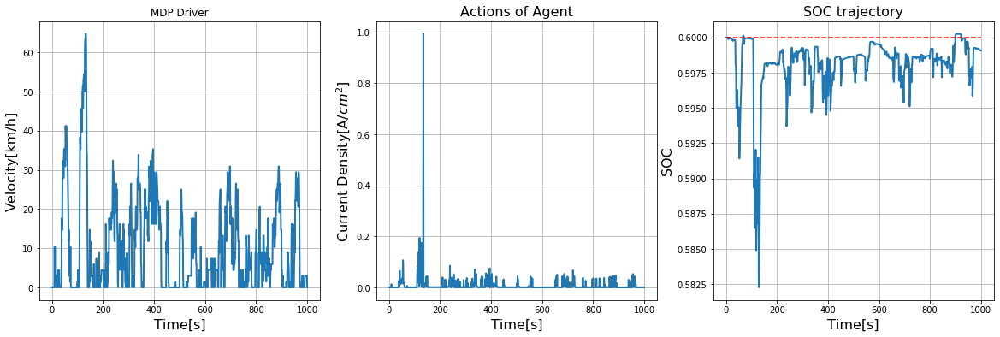

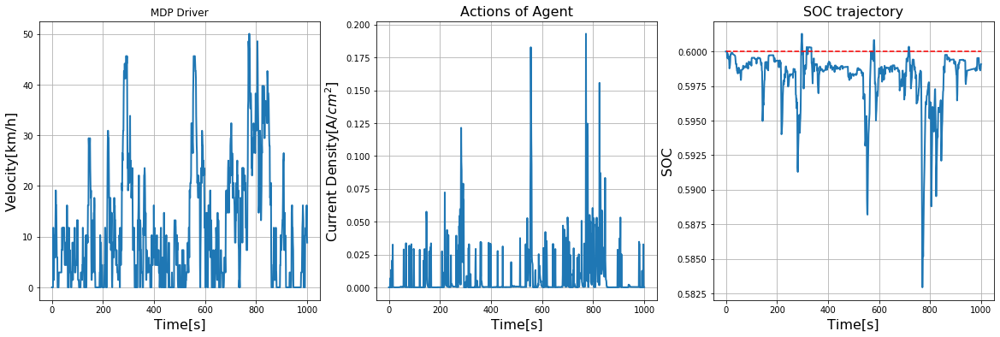

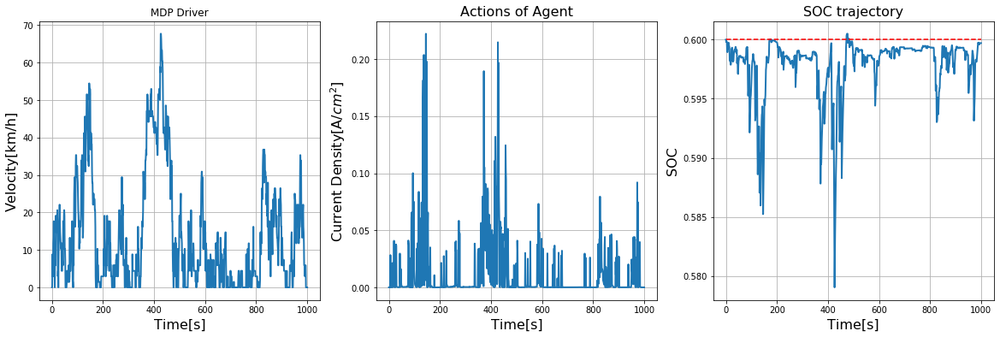

...

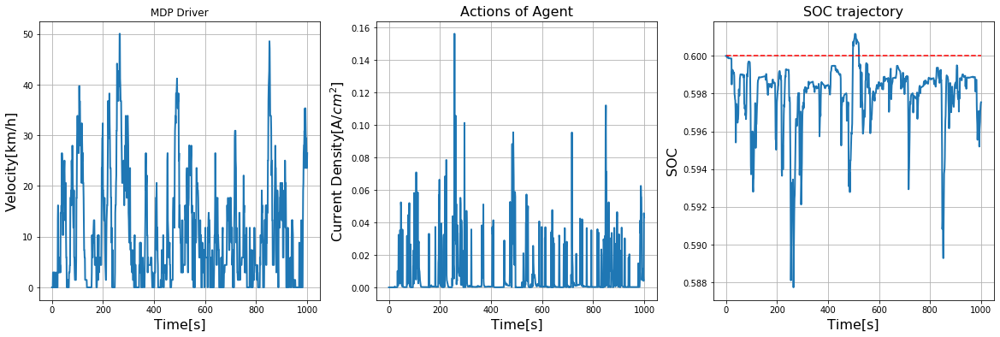

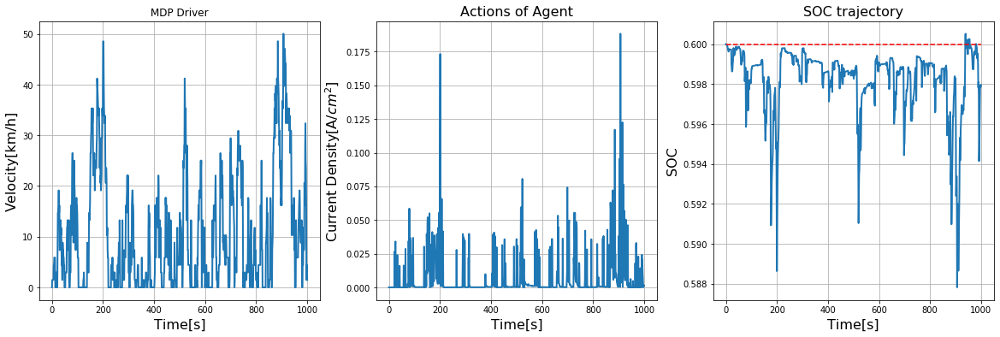

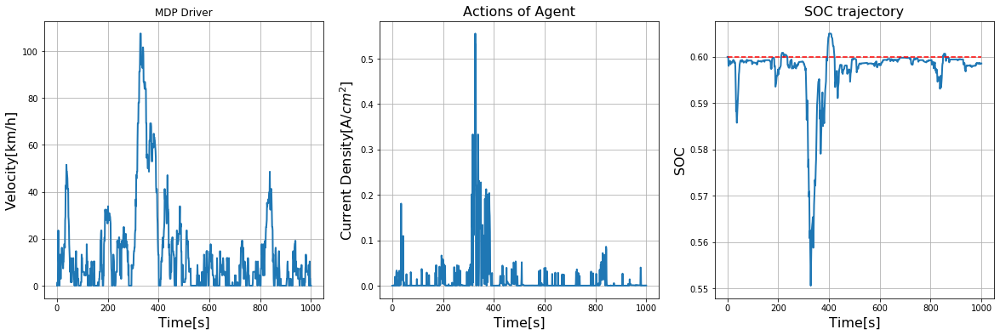

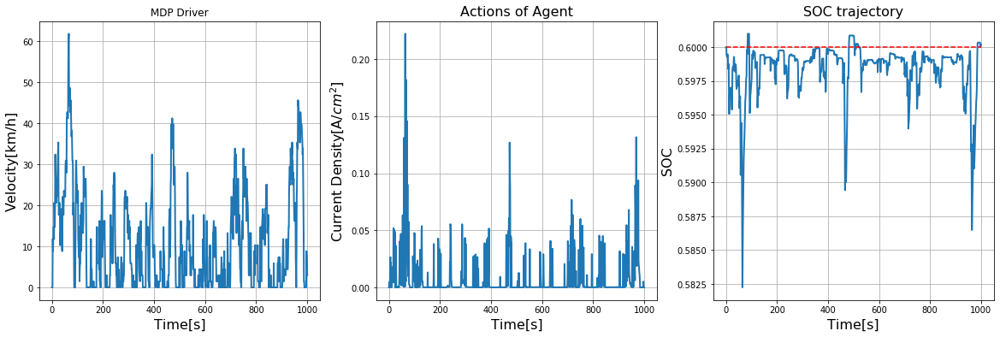

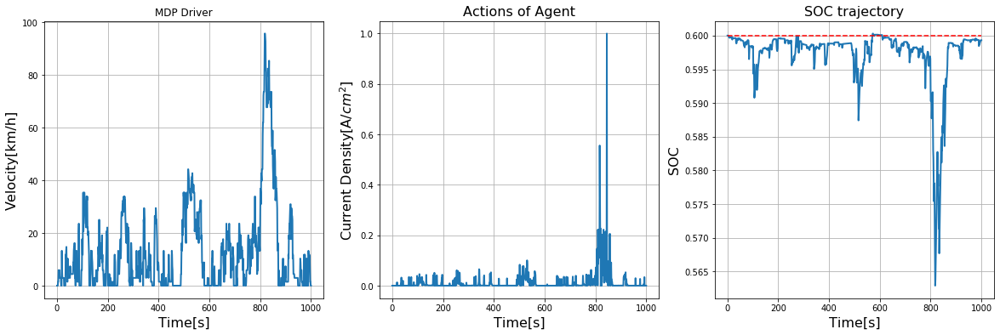

In [18]:
histories = [] 
for iter in range(100):
    driving_cycle = np.array(driver.get_cycle())  

    actor = "./DDPG_MDP_trained/actor_model.h5" 
    history = test_model(driving_cycle, actor, "MDP Driver")
    
    histories.append(history)

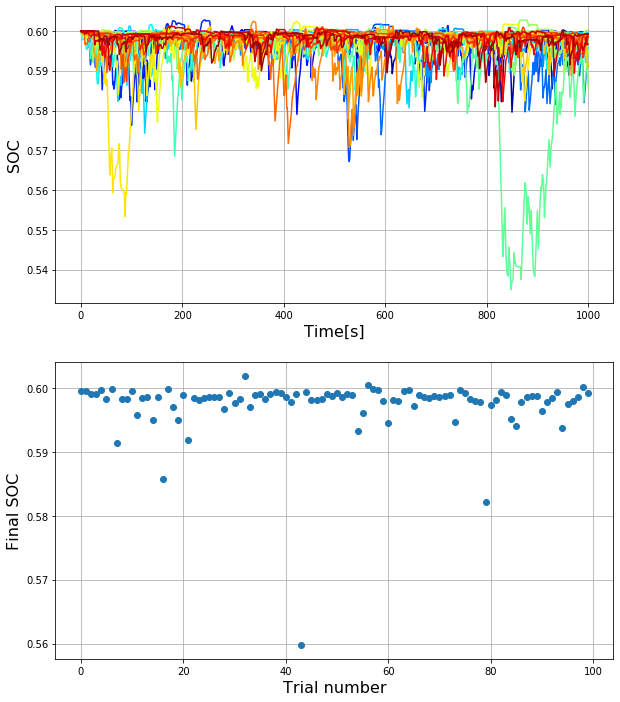

In [35]:
plt.figure(figsize=(10, 12))
cmap = plt.get_cmap('jet')
norm = mpl.colors.Normalize(vmin=1, vmax=30)

plt.subplot(2, 1, 1)
for i, history in enumerate(histories[:30]): 
    color = cmap(float(i) / 30)
    plt.plot(history["SOC"], c=color)
plt.grid() 
plt.xlabel("Time[s]", fontsize=16)
plt.ylabel("SOC", fontsize=16)

plt.subplot(2, 1, 2)
final_SOCs = [history["SOC"][-1] for history in histories]
plt.plot(final_SOCs, "o")
plt.grid() 
plt.xlabel("Trial number", fontsize=16)
plt.ylabel("Final SOC", fontsize=16)

plt.savefig("SOC trajectory and Final SOC.png")

In [36]:
print(np.mean(final_SOCs
             ))

0.597493127152478
